<a href="https://colab.research.google.com/github/Preet3621/EDA_Submission_Preet_Dedaniya/blob/main/EDA_Submission_Preet_Dedaniya.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Hotel booking Exploratory Data Analysis



##### **Project Type**    - EDA
##### **Contribution**    - Individual
##### **Team Member 1**   - Dedaniya Pritkumar Pradipbhai


# **Project Summary -**
The Hotel Booking Data Analytics Project aims to extract insights from a dataset consisting of hotel reservation records. The analysis began by cleaning and preparing the data to remove missing values ​​and discrepancies. We created research visualizations to understand the distribution of variables such as cancellations, length of stay and customer demographics. Key results were peak bookings, popular room types and seasonal booking trends. Factors affecting cancellation such as payment period and deposit type have been considered. In addition, correlations between variables such as booking change, special request and customer satisfaction were examined. This project provided valuable insight into hotel management and decision making.



> Indented block





Write the summary here within 500-600 words.

# **GitHub Link -**

https://github.com/Preet3621/EDA_Submission_Preet_Dedaniya.git



# **Problem Statement**


**Write Problem Statement Here.**

#### **Define Your Business Objective?**

Answer Here.

# **General Guidelines** : -

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.

     The additional credits will have advantages over other students during Star Student selection.

             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.


```
# Chart visualization code
```


*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 20 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [81]:
# Import Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from scipy import stats
from matplotlib import pyplot as plt

### Dataset Loading

In [82]:
# Code to read csv file into colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [83]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [84]:
#Get the file
downloaded = drive.CreateFile({'id':'1C9AxF9fcVzMw0Bgs0NaRrNML2WwX1Ehm'})
downloaded.GetContentFile('Hotel Booking.csv')

In [85]:
df_ = pd.read_csv('Hotel Booking.csv')

### Dataset First View

In [86]:
# Dataset First Look
df_.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


### Dataset Rows & Columns count

In [87]:
# Dataset Rows & Columns count
df_.shape

(119390, 32)

### Dataset Information

In [88]:
# Dataset Info
df_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

#### Duplicate Values

In [89]:
# Dataset Duplicate Value Count
duplicate = pd.DataFrame(df_[df_.duplicated()])
duplicate.shape

(31994, 32)

#### Missing Values/Null Values

In [90]:
# Missing Values/Null Values Count
df_.isnull().sum().sort_values(ascending=False)[:33].count

<bound method Series.count of company                           112593
agent                              16340
country                              488
children                               4
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
hotel                                  0
previous_cancellations                 0
days_in_waiting_list                   0
customer_type                          0
adr                                    0
required_car_parking_spaces            0
total_of_special_requests              0
reservation_status                     0
previous_bookings_not_canceled         0
is_repeated_guest                      0
is_canceled                            0
distribution_channel                   0
market_segment                         0
meal                                   0
babies                                 0
adults                     

In [91]:
# Visualizing the missing values
fig = px.imshow(df_.isnull(), color_continuous_scale='Blues')
fig.show()


### What did you know about your dataset?

Answer Here

## ***2. Understanding Your Variables***

In [92]:
# Dataset Columns
df_.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [93]:
# Dataset Describe
df_.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,119390.0,0.370416,0.482918,0.00,0.00,0.000,1.0,1.0
lead_time,119390.0,104.011416,106.863097,0.00,18.00,69.000,160.0,737.0
arrival_date_year,119390.0,2016.156554,0.707476,2015.00,2016.00,2016.000,2017.0,2017.0
arrival_date_week_number,119390.0,27.165173,13.605138,1.00,16.00,28.000,38.0,53.0
arrival_date_day_of_month,119390.0,15.798241,8.780829,1.00,8.00,16.000,23.0,31.0
stays_in_weekend_nights,119390.0,0.927599,0.998613,0.00,0.00,1.000,2.0,19.0
stays_in_week_nights,119390.0,2.500302,1.908286,0.00,1.00,2.000,3.0,50.0
adults,119390.0,1.856403,0.579261,0.00,2.00,2.000,2.0,55.0
children,119386.0,0.103890,0.398561,0.00,0.00,0.000,0.0,10.0
babies,119390.0,0.007949,0.097436,0.00,0.00,0.000,0.0,10.0


### Variables Description

Answer Here

### Check Unique Values for each variable.

In [94]:
# Check Unique Values for each variable.
def print_unique_values(dataframe):
    for column in dataframe.columns:
        unique_values = dataframe[column].unique()
        print(f"Unique values in column '{column}':")
        print(unique_values)
        print("----------------------------------")

# use this function in our dataset
print_unique_values(df_)

Unique values in column 'hotel':
['Resort Hotel' 'City Hotel']
----------------------------------
Unique values in column 'is_canceled':
[0 1]
----------------------------------
Unique values in column 'lead_time':
[342 737   7  13  14   0   9  85  75  23  35  68  18  37  12  72 127  78
  48  60  77  99 118  95  96  69  45  40  15  36  43  70  16 107  47 113
  90  50  93  76   3   1  10   5  17  51  71  63  62 101   2  81 368 364
 324  79  21 109 102   4  98  92  26  73 115  86  52  29  30  33  32   8
 100  44  80  97  64  39  34  27  82  94 110 111  84  66 104  28 258 112
  65  67  55  88  54 292  83 105 280 394  24 103 366 249  22  91  11 108
 106  31  87  41 304 117  59  53  58 116  42 321  38  56  49 317   6  57
  19  25 315 123  46  89  61 312 299 130  74 298 119  20 286 136 129 124
 327 131 460 140 114 139 122 137 126 120 128 135 150 143 151 132 125 157
 147 138 156 164 346 159 160 161 333 381 149 154 297 163 314 155 323 340
 356 142 328 144 336 248 302 175 344 382 146 170 166 33

## 3. ***Data Wrangling***

### Data Wrangling Code

In [95]:
# Replace the null values
df_["agent"].fillna(0,inplace = True)
df_["company"].fillna(0,inplace = True)
df_["country"].fillna("other",inplace = True)
df_["children"].fillna(0,inplace = True)
df_["adults"].fillna(0,inplace = True)
df_["babies"].fillna(0,inplace = True)
df_['meal'] = df_['meal'].replace(['undefined', 'sc'])

# Remove the rows which have all children, babies and adults values are zero.
cleaned_series = (df_["children"]==0) & (df_["adults"]==0) & (df_["babies"]==0)
df_ = pd.DataFrame(df_[~cleaned_series])

# Drop the duplicate rows
df_ =(df_.drop_duplicates())

In [96]:
# Change data type of some columns
df_[['children', 'company', 'agent']] = df_[['children', 'company', 'agent']].astype('int64')
df_['reservation_status_date'] = pd.to_datetime(df_['reservation_status_date'], format = '%Y-%m-%d')

df_['arrival_date_month'] = pd.to_datetime(df_['arrival_date_month'], format='%B')
df_["quarter"] = df_["arrival_date_month"].dt.quarter

# Doing some Arithmatic operations
df_['no_of_people'] = df_['adults']+ df_['children']+ df_['babies']
df_["Total_stay"] = df_["stays_in_weekend_nights"] + df_["stays_in_week_nights"]

# fill the rows which have values 'undefined' with some logical inputs according to individual column values.
df_['meal'].replace(['undefined', 'sc'],inplace = True)
df_['market_segment'].replace(["Undefined","offline TA/TO"],inplace = True)

# make new column that tells us whether custome get same room which he has been booked.
df_['same_room_not_alloted'] = df_['reserved_room_type'].ne(df_['assigned_room_type']).astype(int)


In [97]:
# final check
df_.count()

hotel                             87230
is_canceled                       87230
lead_time                         87230
arrival_date_year                 87230
arrival_date_month                87230
arrival_date_week_number          87230
arrival_date_day_of_month         87230
stays_in_weekend_nights           87230
stays_in_week_nights              87230
adults                            87230
children                          87230
babies                            87230
meal                              87230
country                           87230
market_segment                    87230
distribution_channel              87230
is_repeated_guest                 87230
previous_cancellations            87230
previous_bookings_not_canceled    87230
reserved_room_type                87230
assigned_room_type                87230
booking_changes                   87230
deposit_type                      87230
agent                             87230
company                           87230


### What all manipulations have you done and insights you found?

Answer Here.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

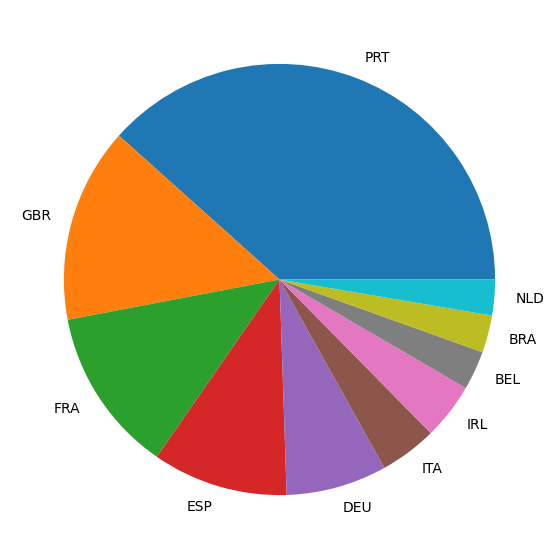

In [98]:
# Chart - 1 visualization code
max_visited_people_countries = pd.DataFrame(df_.groupby('country')["no_of_people"].count()).sort_values(by="no_of_people",ascending=False)

fig = plt.figure(figsize =(10, 7))
plt.pie(max_visited_people_countries["no_of_people"][:10], labels = max_visited_people_countries.index[:10])

# show plot
plt.show()


##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 2

<Axes: xlabel='hotel', ylabel='percentage_of_booking'>

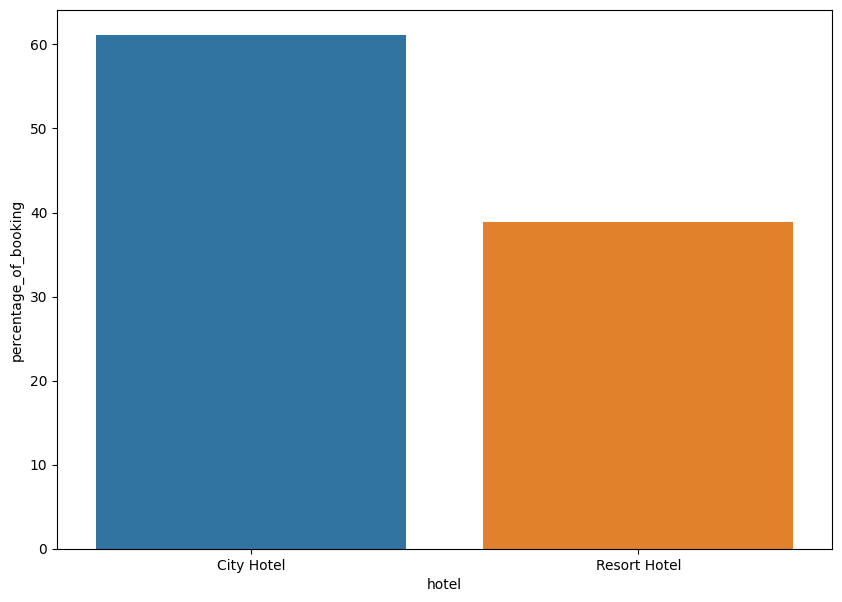

In [99]:
# Chart - 2 visualization code
x1 = pd.DataFrame((df_.groupby('hotel').size()/df_.shape[0])*100).reset_index().rename(columns = {0:'percentage_of_booking'})

plt.figure(figsize = (10,7))
sns.barplot(x = x1['hotel'], y = x1['percentage_of_booking'])

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 3

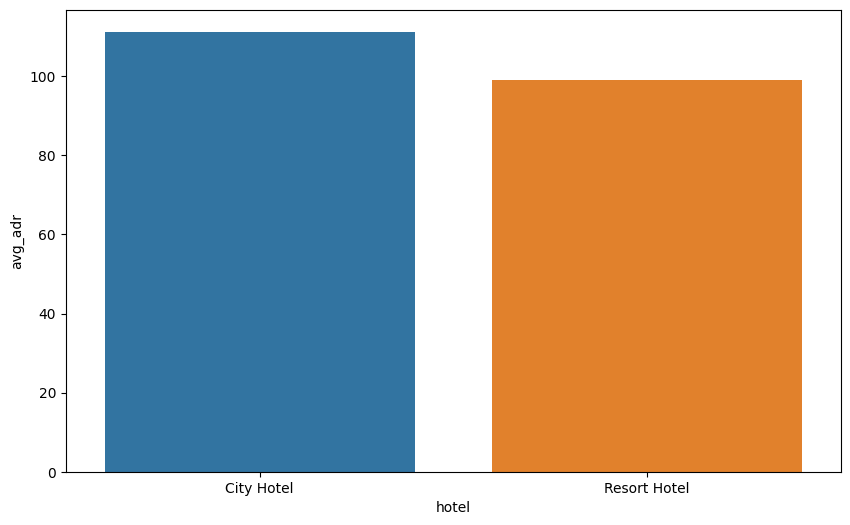

In [100]:
# Chart - 3 visualization code
Hotel_avg_adr = df_.groupby("hotel")['adr'].mean().reset_index().rename(columns = {'adr':'avg_adr'})
plt.figure(figsize = (10,6))
sns.barplot(x = Hotel_avg_adr['hotel'], y = Hotel_avg_adr['avg_adr'] )
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 4

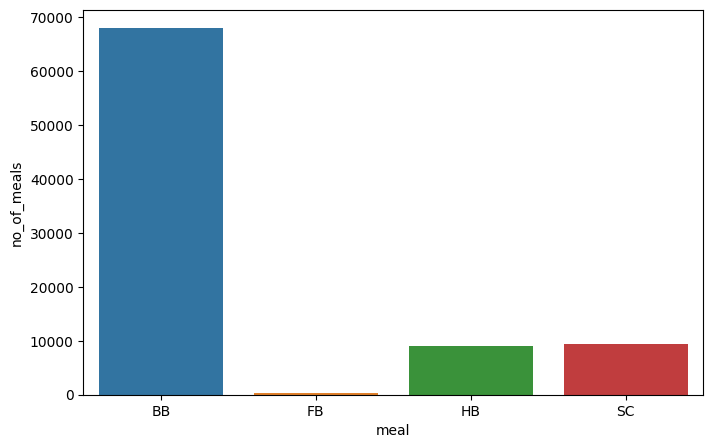

In [101]:
# Chart - 4 visualization code
s2 = pd.DataFrame(df_.groupby("meal").size().reset_index().rename(columns = {0:'no_of_meals'}))
plt.figure(figsize = (8,5))
sns.barplot(x = s2['meal'][:4], y = s2['no_of_meals'][:4] )
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 5

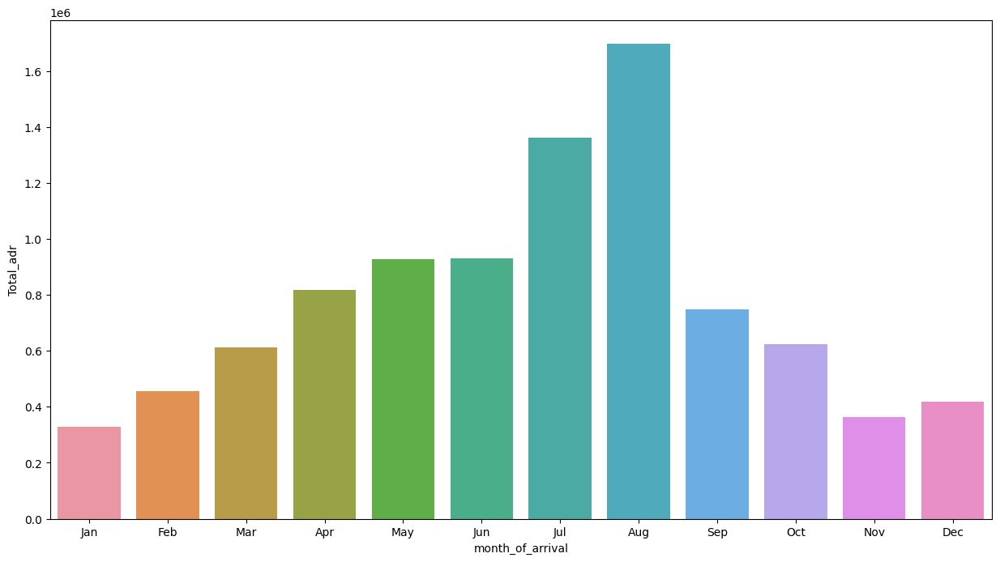

In [102]:
# Chart - 5 visualization code
df_['month_of_arrival'] = df_['arrival_date_month'].dt.strftime('%b')
ordered_month = ['Jan', 'Feb', 'Mar','Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
df_['month_of_arrival'] = pd.Categorical(df_['month_of_arrival'],categories=ordered_month,ordered=True)
s3 = pd.DataFrame(df_.groupby("month_of_arrival")["adr"].sum().reset_index().rename(columns = {"adr":"Total_adr"}))

plt.figure(figsize = (15,8))
sns.barplot(x = s3['month_of_arrival'], y = s3['Total_adr'])
plt.show()

#### Chart -  6

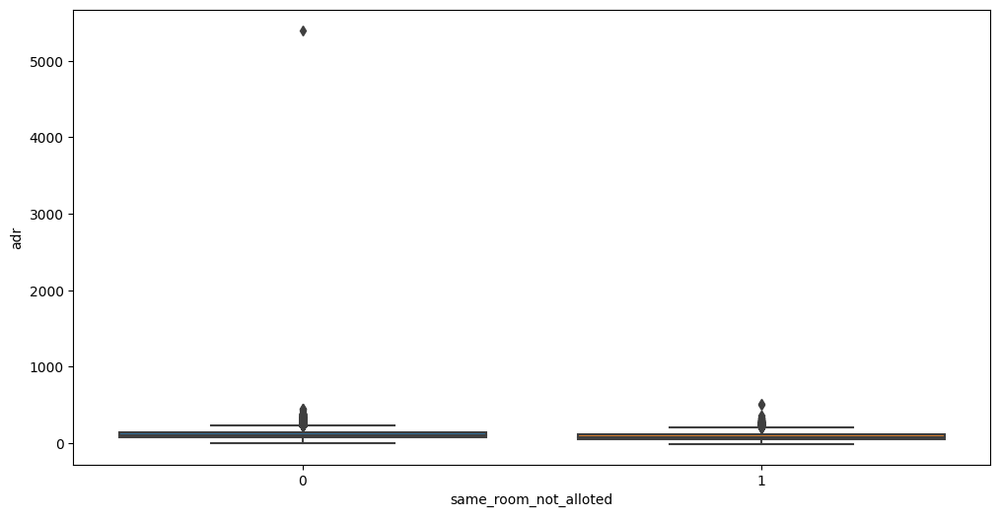

In [103]:
plt.figure(figsize = (12,6))
sns.boxplot(x = 'same_room_not_alloted', y = 'adr', data = df_)
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 7

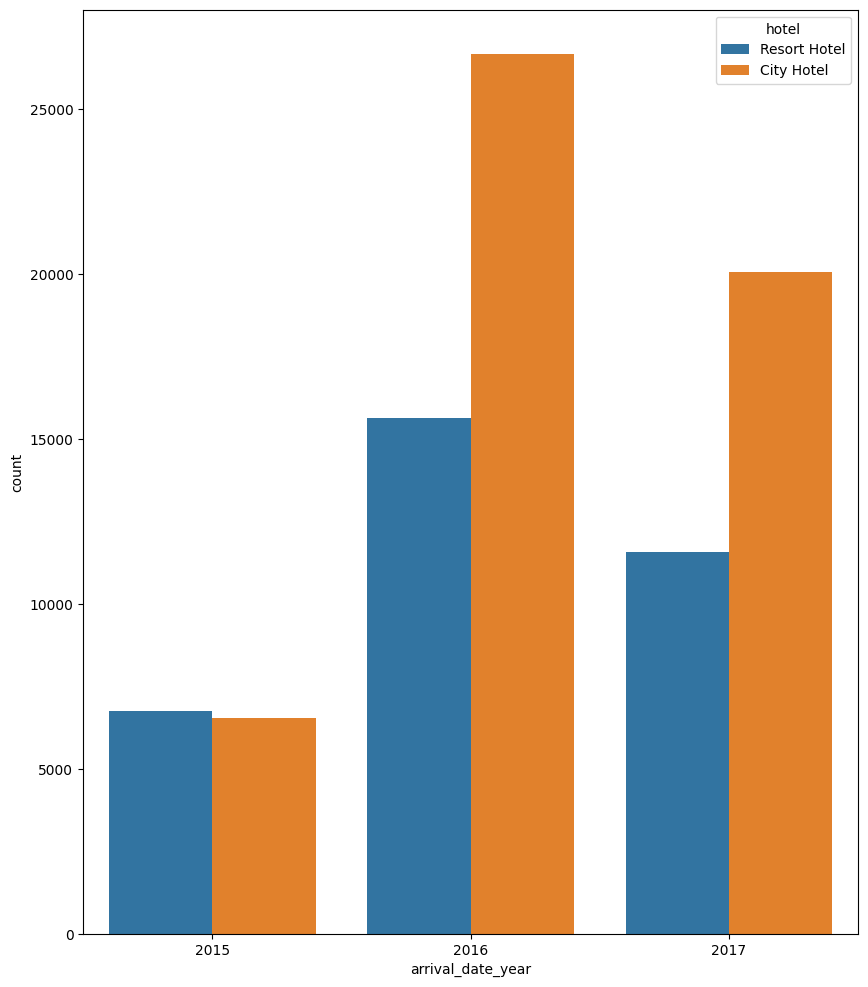

In [104]:
# Chart - 6 visualization code
d1 = ['hotel', 'arrival_date_year', 'arrival_date_month' ]
Arrival_period = df_[d1]
fig, ax = plt.subplots(figsize=(10, 12))
sns.countplot(data = Arrival_period, x = 'arrival_date_year', hue = 'hotel')
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 8

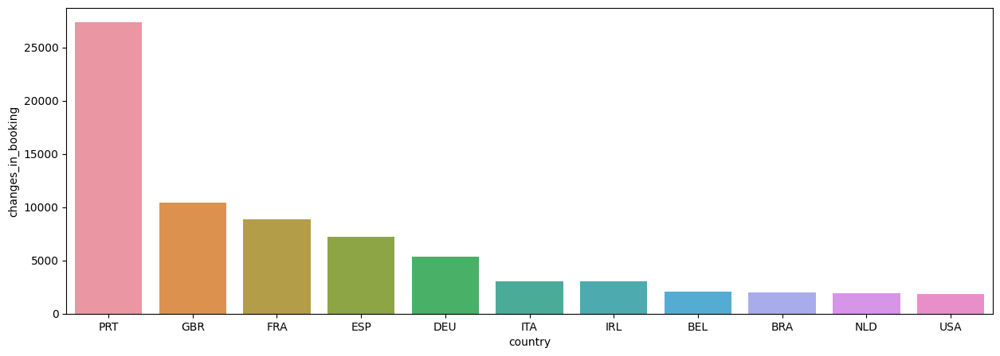

In [105]:
# Chart - 7 visualization code
changes_ = df_[df_["booking_changes"]>=0]
most_changes_by_country = pd.DataFrame(changes_.groupby("country").size().sort_values(ascending=False).reset_index().rename(columns = {0:"changes_in_booking"}))[:11]
most_changes_by_country

plt.figure(figsize = (15,5))
sns.barplot(x = most_changes_by_country['country'], y = most_changes_by_country['changes_in_booking'])
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 9

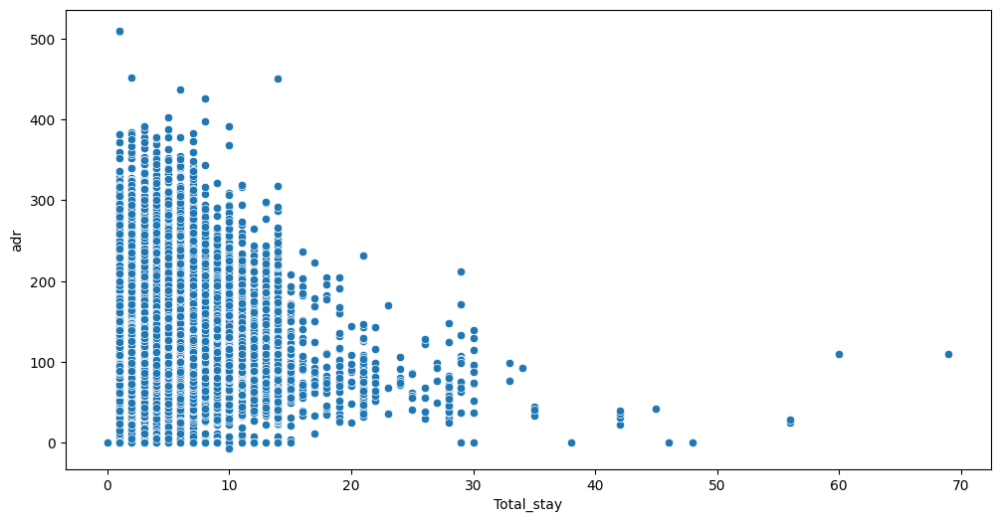

In [106]:
# Chart - 8 visualization code
plt.figure(figsize = (12,6))
df_.drop(df_[df_['adr'] > 5000].index, inplace = True)
sns.scatterplot(y = 'adr', x = 'Total_stay', data = df_)
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 10

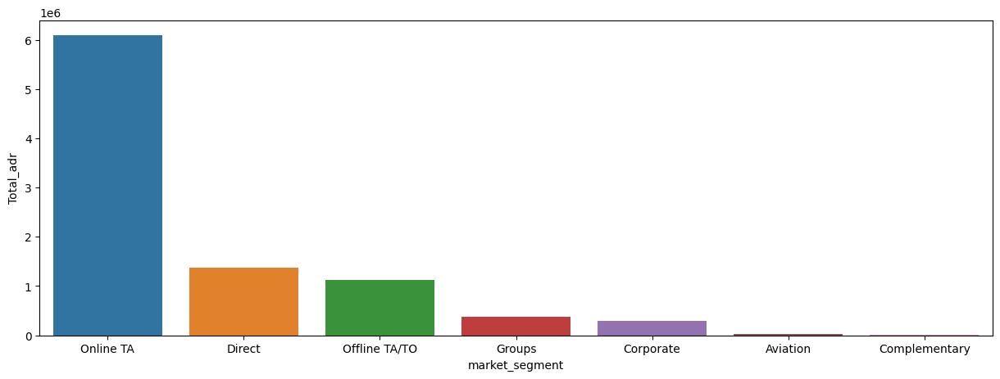

In [107]:
# Chart - 9 visualization code
s4 = pd.DataFrame(df_.groupby("market_segment")["adr"].sum().sort_values(ascending=False).reset_index().rename(columns = {"adr":"Total_adr"}))
plt.figure(figsize = (15,5))
sns.barplot(x = s4['market_segment'][:7], y = s4['Total_adr'][:7])
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 11

[]

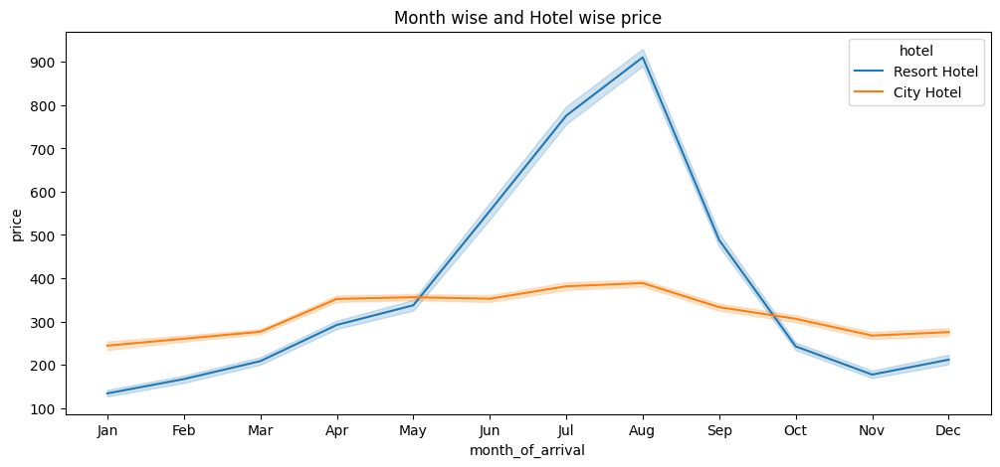

In [108]:
# Chart - 10 visualization code
plt.figure(figsize=(12,5))
plt.title("Month wise and Hotel wise price")

# Calculating average daily rate per person
df_['adr_per_person'] = df_['adr'] / (df_['adults'] + df_['children'])
Actual_guests = df_.loc[df_["is_canceled"] == 0]
Actual_guests['price'] = Actual_guests['adr'] * (Actual_guests['stays_in_weekend_nights'] + Actual_guests['stays_in_week_nights'])
sns.lineplot(data = Actual_guests, x = 'month_of_arrival', y = 'price', hue = 'hotel')
plt.plot()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 12

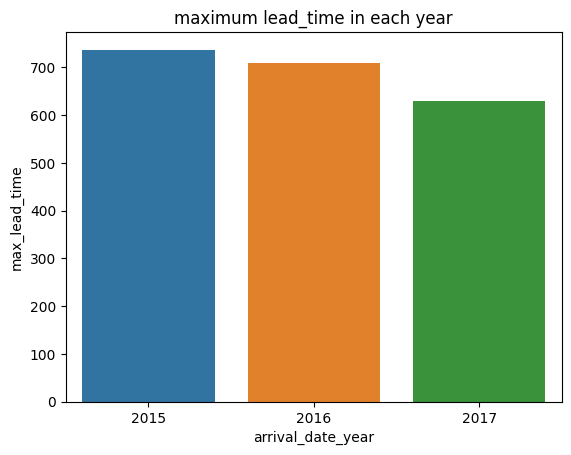

In [109]:
# Chart - 11 visualization code
bar_data = pd.DataFrame(df_.groupby("arrival_date_year")["lead_time"].max().sort_values(ascending = False).reset_index().rename(columns={"lead_time":"max_lead_time"}))
sns.barplot(x = bar_data["arrival_date_year"] ,y = bar_data["max_lead_time"],data = bar_data)
plt.title("maximum lead_time in each year")
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 13

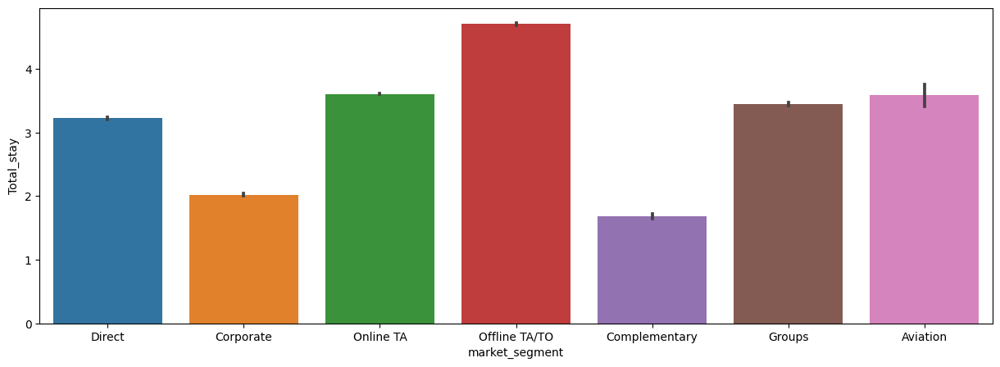

In [110]:
# Chart - 12 visualization code
plt.figure(figsize = (15,5))
sns.barplot(x = df_["market_segment"],y = df_["Total_stay"],data = df_,ci = 50)
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 14

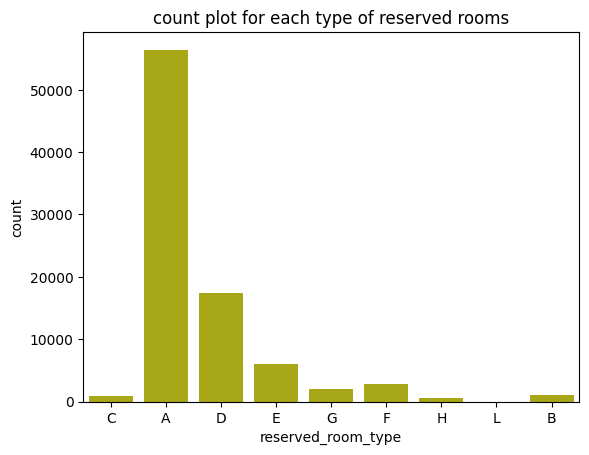

In [111]:
# Chart - 13 visualization code
sns.countplot(x = df_["reserved_room_type"],data = df_,color = 'y')
plt.title("count plot for each type of reserved rooms")
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 15 (Violine plot)

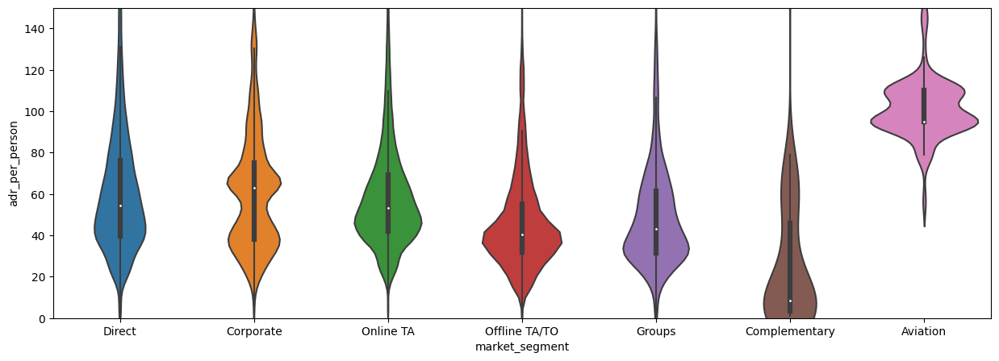

In [112]:
c_1 = (df_["adr_per_person"]!=0) & (df_["adr_per_person"] >= 1 & (df_["adr_per_person"] < 76))
c_2 = pd.DataFrame(df_[c_1])
plt.figure(figsize = (15,5))
sns.violinplot(x = c_2["market_segment"] , y = c_2["adr_per_person"],data = c_2)
plt.ylim(0, 150)
plt.show()

#### Chart - 16 (Correlation Heatmap)

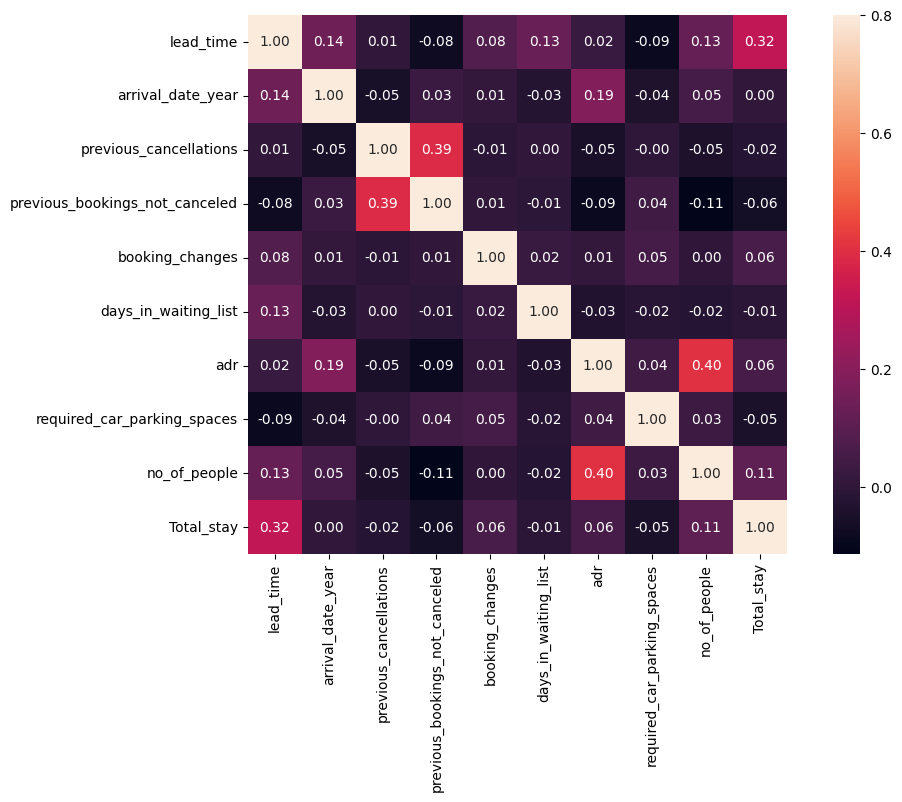

In [113]:
# Correlation Heatmap visualization code
category_cols = ['lead_time', 'arrival_date_year',
                 'previous_cancellations', 'previous_bookings_not_canceled',
                 'booking_changes','days_in_waiting_list','adr',
                 'required_car_parking_spaces',
                 'no_of_people', 'Total_stay',
                ]

num_cols =  df_[[i for i in df_.columns if i in category_cols]]

#correlation matrix
corrmat = num_cols.corr()
f, ax = plt.subplots(figsize=(12, 7))
sns.heatmap(corrmat,annot = True,fmt='.2f', annot_kws={'size': 10},  vmax=.8, square=True);

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

#### Chart - 17 (Pair Plot)

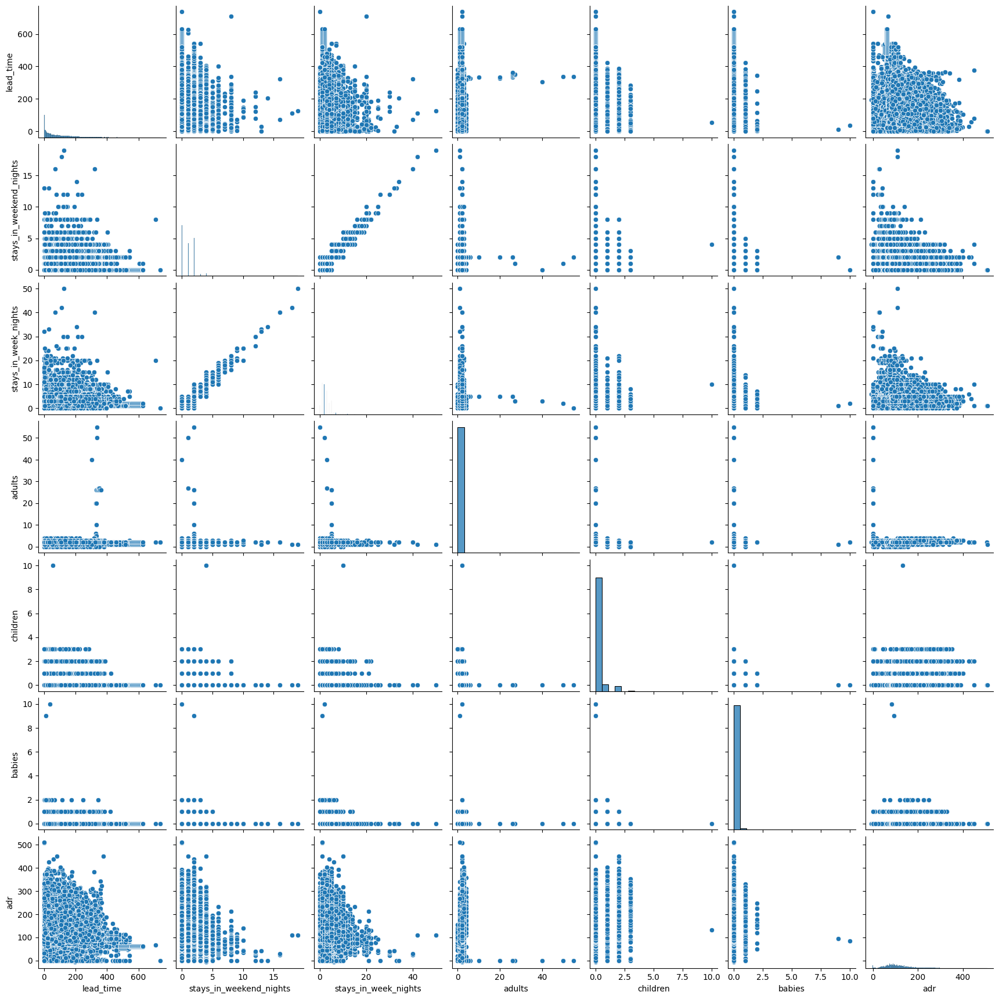

In [114]:
# Pair Plot visualization code
col_for_pair = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'adr']

# Subset the DataFrame to include only the specified columns
df_subset = df_[col_for_pair]

# Create the pair plot
sns.pairplot(df_subset)

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

## **5. Solution to Business Objective**

#### What do you suggest the client to achieve Business Objective ?
Explain Briefly.

Answer Here.

# **Conclusion**

Write the conclusion here.

### ***Hurrah! You have successfully completed your EDA Capstone Project !!!***